In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import healpy as hp

## 1. Open the data
#### /home/inlabru_project/micecat2_data_small.csv.bz2 is 1/256 of full datasets, for testing
#### /home/inlabru_project/micecat2_data_wl.csv.bz2 includes also the data for weak lensing survey ($\kappa$,$\gamma_1$,$\gamma_2$)
#### /home/inlabru_project/micecat2_data.csv.bz2 is full size of N-body simulation. 
#### Open the csv.bz2 file is possible to open with padas.

In [2]:
import pandas as pd

def read_pandas(catalog_filename, index_col=None, chunksize=10000):
    dtype_dict = {'col1': 'int32', 'col2': 'float32'}  # Define appropriate types for each column
    for chunk in pd.read_csv(catalog_filename, sep=",", index_col=index_col, comment='#', na_values=r'\N', 
                             compression='bz2', chunksize=chunksize, dtype=dtype_dict):
        print(chunk.head())  # Process or use data here
        return chunk

In [3]:
# Define the path to the catalog compressed CSV file:
catalog_filename = "/home/inlabru_project/micecat2_data_small.csv.bz2"
index_col = ["unique_gal_id"]
chunksize = 200_000_000
data_gal = read_pandas(catalog_filename, index_col=index_col, chunksize=chunksize)

                  ra_gal    dec_gal   z_cgal  z_cgal_v  z_desdm_mc
unique_gal_id                                                     
373143579      26.422090  48.192754  1.01901   1.01948    1.104372
486189851      72.937500  41.313107  0.44484   0.44537    0.340315
483061019      78.743395   7.139959  0.28544   0.28609    0.272318
480245787      30.590492   1.145979  0.41121   0.41156    0.416370
18480155       32.157218  42.723187  0.22479   0.22342    0.223840


In [4]:
# Getting the data from
ra      = data_gal["ra_gal"] # Right ascension in degrees
dec     = data_gal["dec_gal"] # Declination in degrees
z       = data_gal["z_cgal"] # Redshift
z_photo = data_gal["z_desdm_mc"] # Photometric redshift

## 2. Understanding the data
#### Visualize the projection or histogram and understand more was ist los

In [5]:
# Print the length of the data
print(len(ra), len(dec), len(z), len(z_photo))

1951814 1951814 1951814 1951814


#### Nicht so viel, locker

In [6]:
# Functions of plotting and converting the data
def scatter_plot(ra, dec, z): # Create a scatter plot
    plt.figure(figsize=(10, 5))
    plt.scatter(ra, dec, c=z, s=1, cmap='viridis')
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.colorbar(label='Redshift')
    plt.title('RA vs DEC')
    plt.grid()
    plt.show()

def polar_plot(ra, dec, z): # Create a polar projection plot
    ra_rad  = np.deg2rad(ra) # Convert degree to radians

    # Create a polar plot
    plt.figure(figsize=(7, 7))
    ax = plt.subplot(111, projection='polar')
    # Scatter plot with RA as the angular coordinate and redshifts as the radial coordinate
    sc = ax.scatter(ra_rad, z, c=dec, cmap='viridis', alpha=0.6, edgecolors='w', linewidth=0.5, s=10)
    # Add colorbar displaying the declination
    cbar = plt.colorbar(sc, ax=ax, pad=0.1)
    cbar.set_label('Dec in degrees')
    ax.set_title('RA vs Redshift in Polar Coordinates')
    plt.show()

def mollweide_plot(ra, dec, z): # Create a Mollweide projection plot
    ra_rad  = np.deg2rad(ra) # Convert degree to radians
    dec_rad = np.deg2rad(dec)
    plt.figure(figsize=(10, 5))
    ax = plt.subplot(111, projection='mollweide')
    # Scatter plot with RA and DEC in radians
    sc = ax.scatter(ra_rad, dec_rad, c=z, cmap='viridis', alpha=0.6, edgecolors='w', linewidth=0.5, s=5)
    # Add colorbar for redshift
    cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.1)
    cbar.set_label('Redshift')
    
    ax.set_xlabel('RA')
    ax.set_ylabel('DEC')
    ax.set_title('RA vs DEC in Spherical Coordinates (Mollweide Projection)')
    plt.grid()
    plt.show()

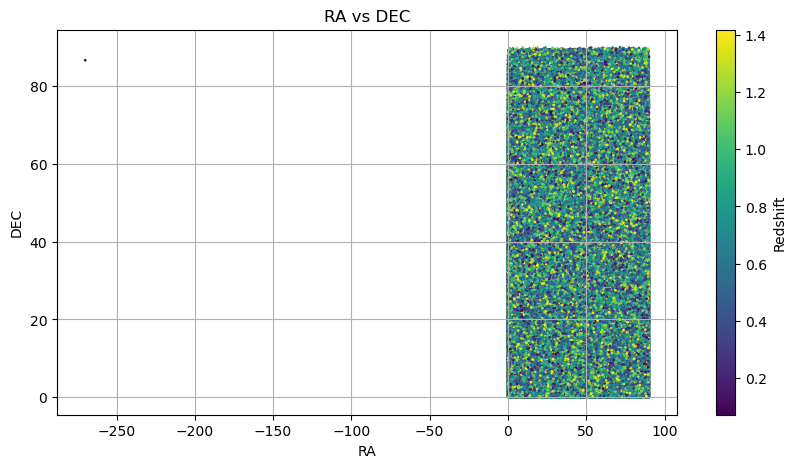

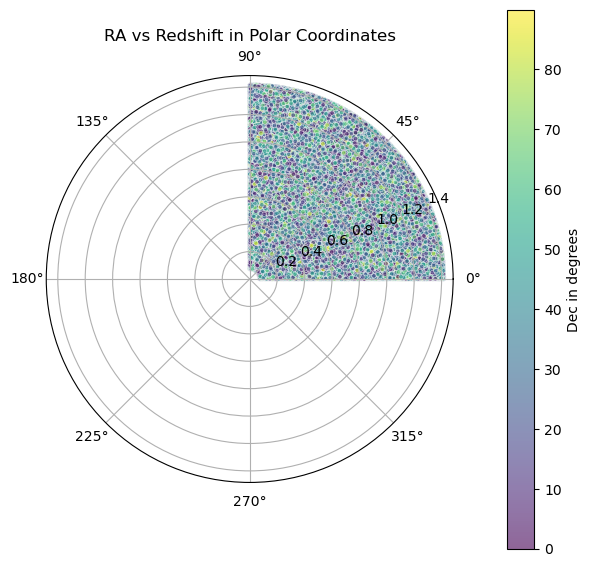

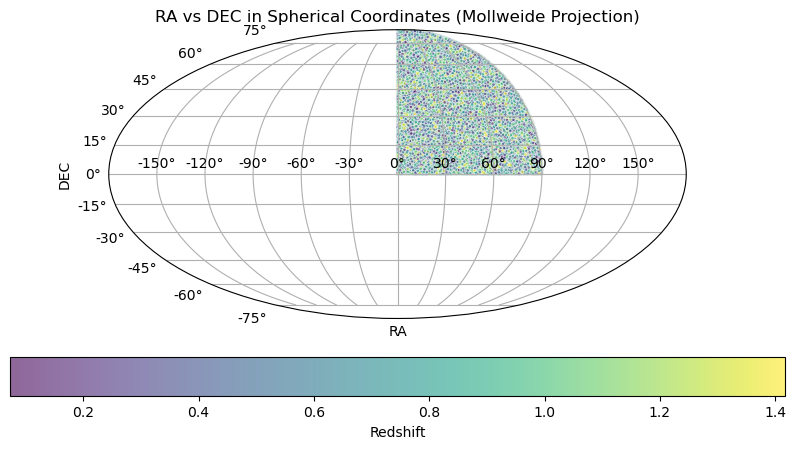

In [7]:
scatter_plot(ra, dec, z)
polar_plot(ra, dec, z)
mollweide_plot(ra, dec, z)

#### Also $0<Ra<90$,$0<dec<90$,$0<z<1.4$, so agreed with what is written in paper!

In [8]:
# Now making the histogram of the redshifts
def histo_redshifts(z, schnitt):
    bins = np.arange(0, z.max(), schnitt)
    plt.figure(figsize=(8, 4))
    plt.hist(z, bins=bins, color='blue', alpha=0.7, edgecolor='black')
    plt.xlabel('Redshift')
    plt.ylabel('Frequency')
    plt.title('Histogram of Redshifts')
    plt.grid()
    plt.show();

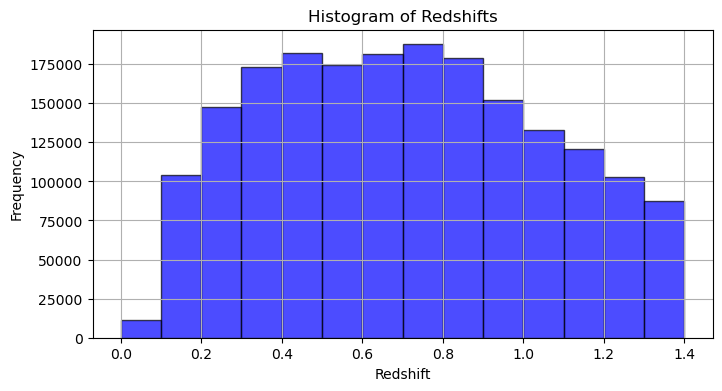

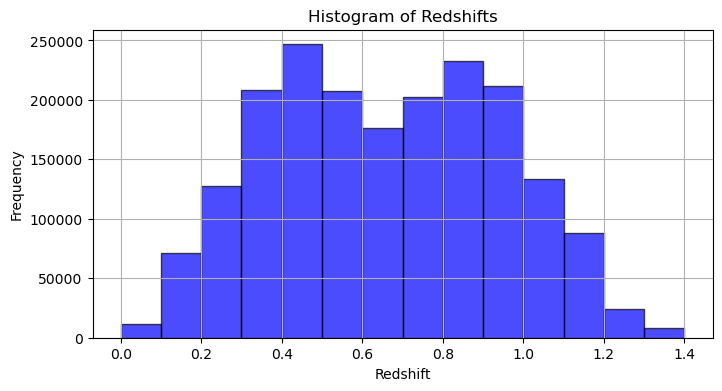

In [9]:
histo_redshifts(z, 0.1)
histo_redshifts(z_photo, 0.1)

#### Ich weiss net, warum beide stimmt nicht, aber vllt nur par 1000 galaxies, zu wenig.

## 2. Healpix
#### Maybe 10 photometric redshifts bins?
#### Counts the number of galaxy in each pixels.

In [22]:
# Define the number of bins
num_bins = 14

# Create bins for the redshifts
z_bins = pd.cut(z, bins=num_bins, labels=False)

# Split the data for each redshift bin
binned_data = {}
for i in range(num_bins):
    binned_data[i] = data_gal[z_bins == i]

# Print the number of entries in each bin
for i in range(num_bins):
    print(f"Bin {i}: {len(binned_data[i])} entries")

Bin 0: 76492 entries
Bin 1: 130489 entries
Bin 2: 160351 entries
Bin 3: 174489 entries
Bin 4: 169447 entries
Bin 5: 169296 entries
Bin 6: 178829 entries
Bin 7: 178017 entries
Bin 8: 163347 entries
Bin 9: 139010 entries
Bin 10: 123858 entries
Bin 11: 111204 entries
Bin 12: 95128 entries
Bin 13: 81857 entries


In [23]:
def Healpix_map(bin_num,nside=64):
    ra=binned_data[bin_num]["ra_gal"]
    dec=binned_data[bin_num]["dec_gal"]
    # Convert the ra and dec to theta and phi
    theta = np.pi/2 - np.deg2rad(dec)
    phi = np.deg2rad(ra)
    
    # Get the pixel number for each ra, dec pair
    pixels = hp.ang2pix(nside, theta, phi)
    
    # Create a HEALPix map with the number of galaxies in each pixel
    Healpix_map = np.bincount(pixels, minlength=hp.nside2npix(nside))
    return Healpix_map
    # Plot the map

def visualize_healpix(map, bin_num):
    hp.mollview(map, title="Redshift Bin "+str(bin_num), unit="Number of Galaxies", cmap='viridis')
    hp.graticule()
    plt.show()

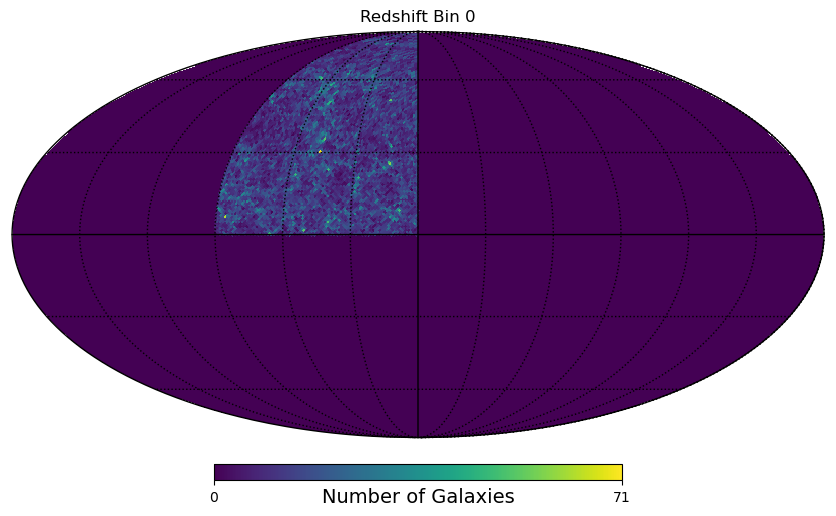

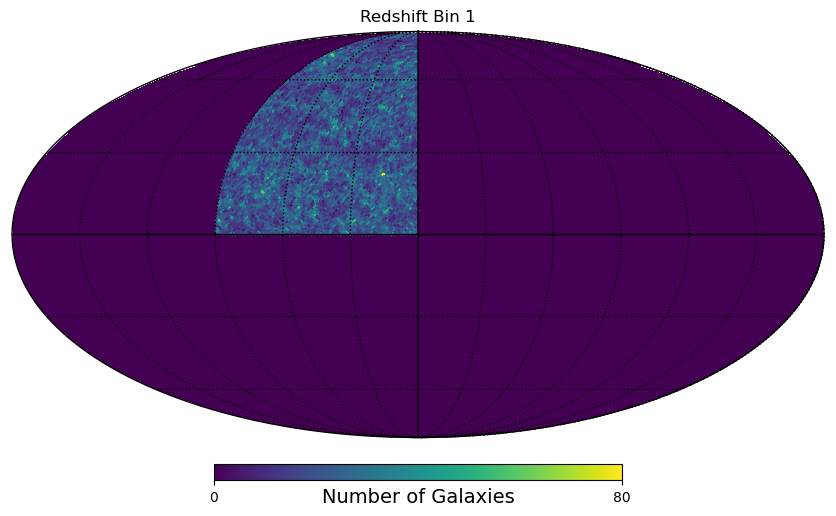

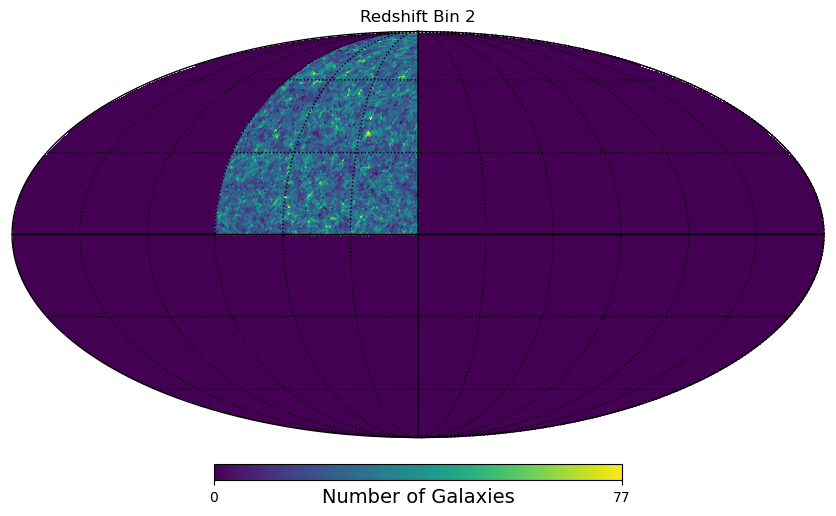

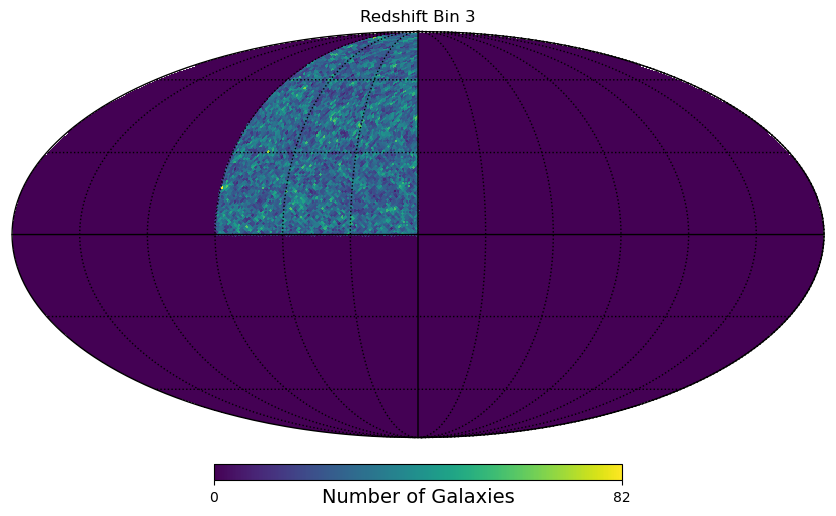

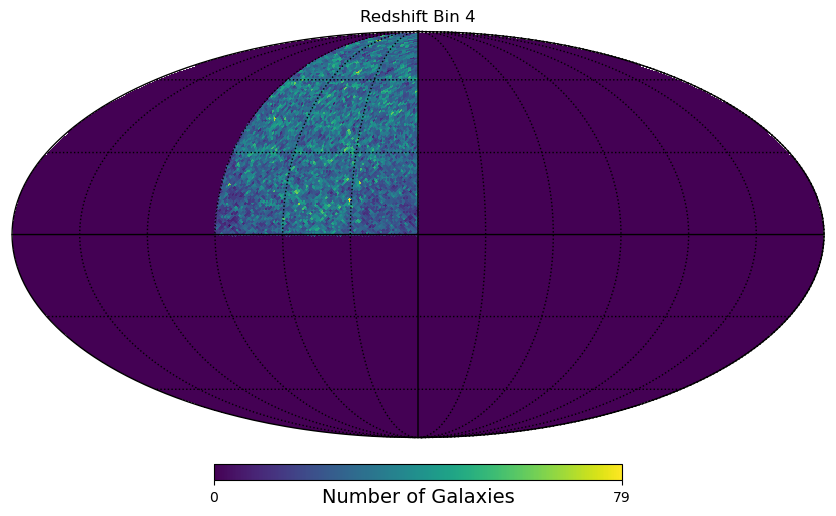

...

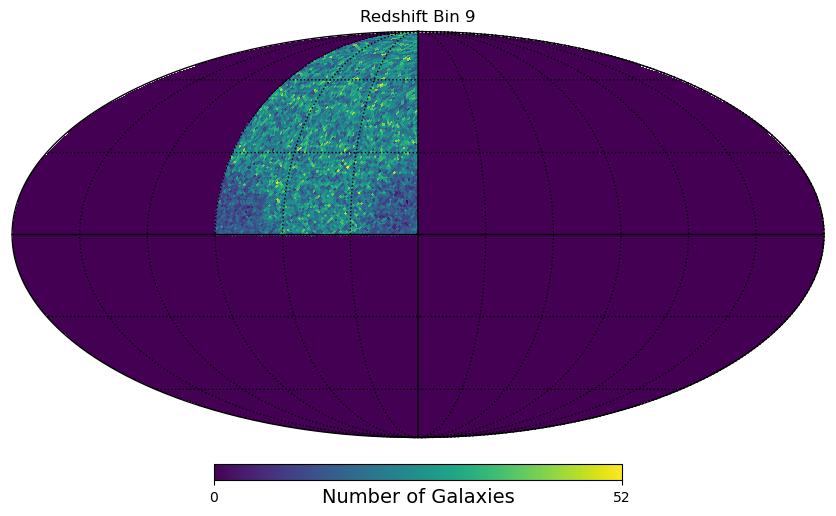

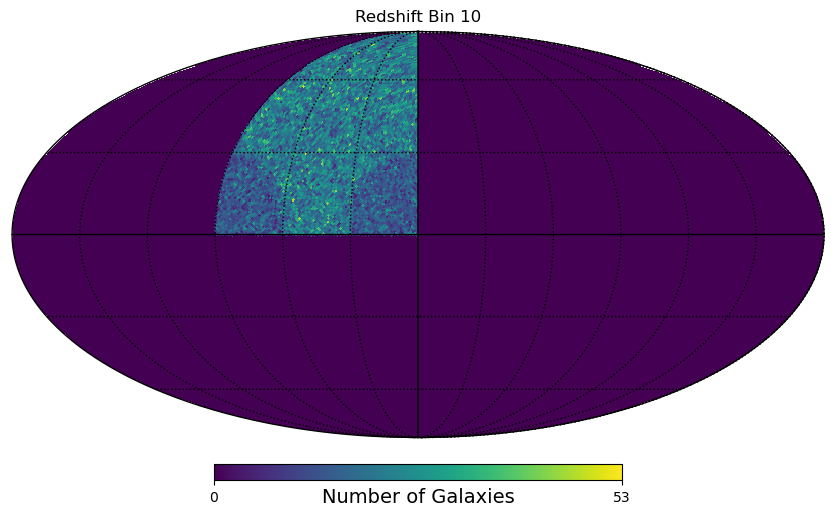

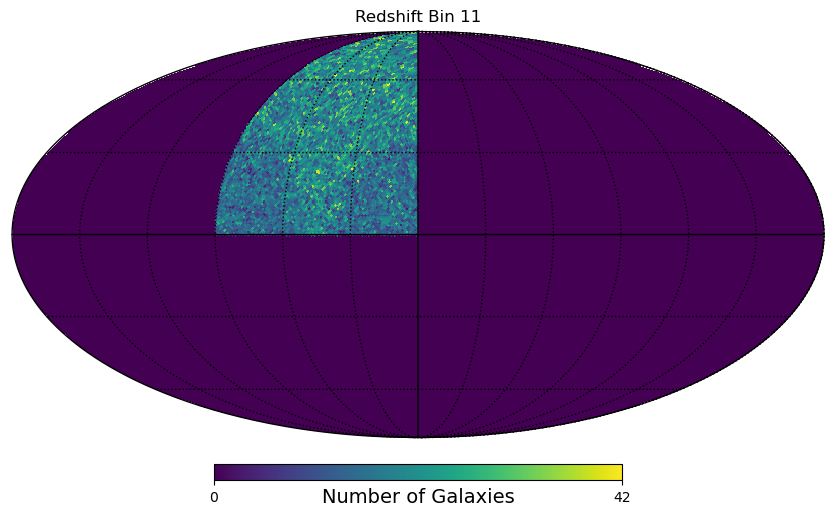

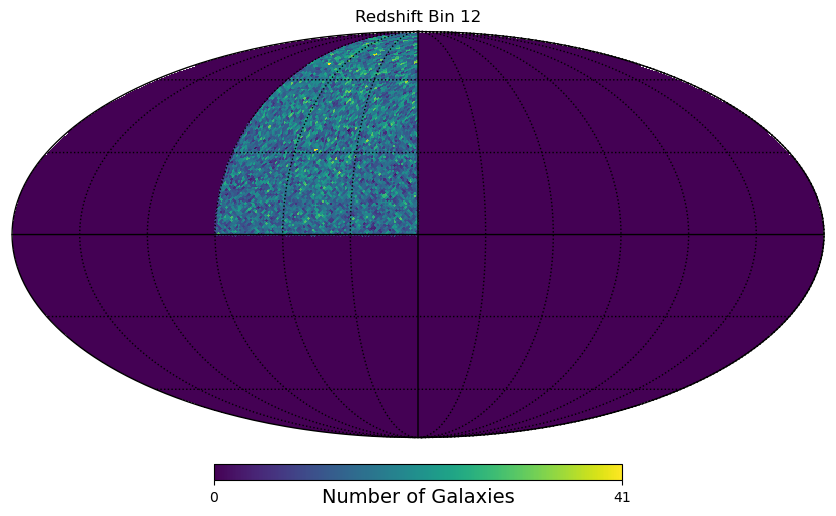

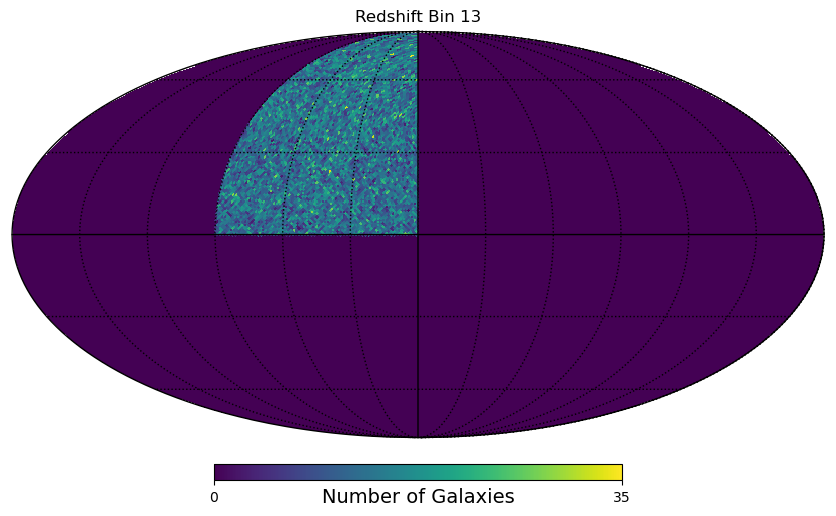

In [24]:
for i in range(num_bins):
    Healpix_map(i, nside=64)
    visualize_healpix(Healpix_map(i, nside=64), i)

In [25]:
def plot_region_of_interest(ra, dec, z, ra_min, ra_max, dec_min, dec_max):
    # Filter the data based on the region of interest
    mask = (ra >= ra_min) & (ra <= ra_max) & (dec >= dec_min) & (dec <= dec_max)
    ra_roi = ra[mask]
    dec_roi = dec[mask]
    z_roi = z[mask]
    
    # Plot the scatter plot for the region of interest
    scatter_plot(ra_roi, dec_roi, z_roi)
    
    # Plot the polar plot for the region of interest
    #polar_plot(ra_roi, dec_roi, z_roi)
    
    # Plot the Mollweide plot for the region of interest
    #mollweide_plot(ra_roi, dec_roi, z_roi)

# Calculate the number of galaxies in each pixel for a specific bin
def calculate_galaxies_per_pixel(bin_num,ra_min, ra_max, dec_min, dec_max, nside=64):
    ra = binned_data[bin_num]["ra_gal"]
    dec = binned_data[bin_num]["dec_gal"]
        
    # Filter the data based on the region of interest
    mask = (ra >= ra_min) & (ra <= ra_max) & (dec >= dec_min) & (dec <= dec_max)
    ra = ra[mask]
    dec = dec[mask]
        
    theta = np.pi/2 - np.deg2rad(dec)
    phi = np.deg2rad(ra)
        
    pixels = hp.ang2pix(nside, theta, phi)
    counts = np.bincount(pixels, minlength=hp.nside2npix(nside))
    return counts

Plotting for redshift bin 0


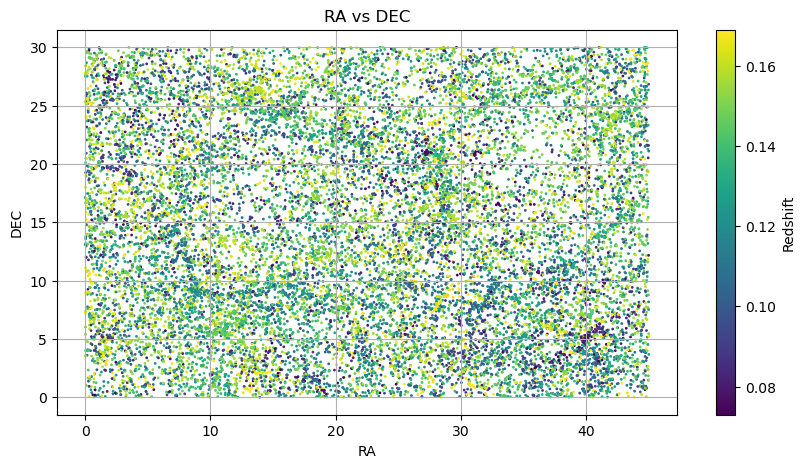

Plotting for redshift bin 1


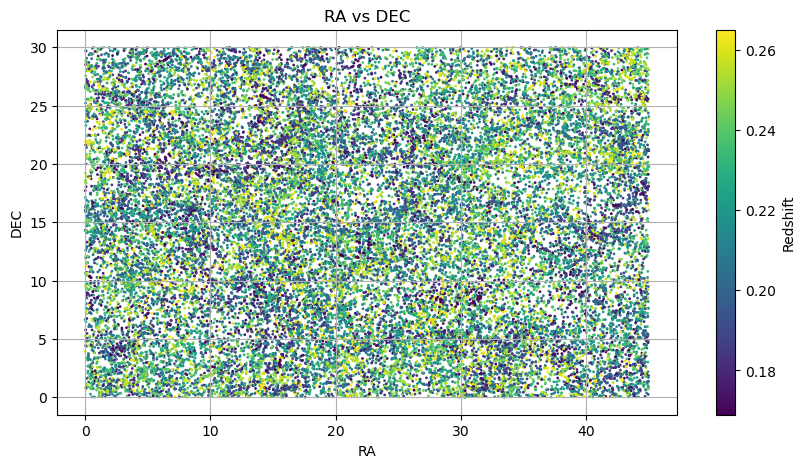

Plotting for redshift bin 2


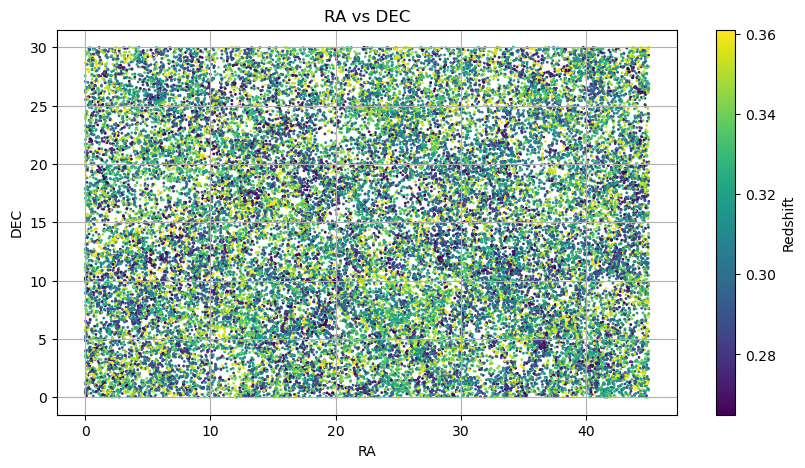

Plotting for redshift bin 3


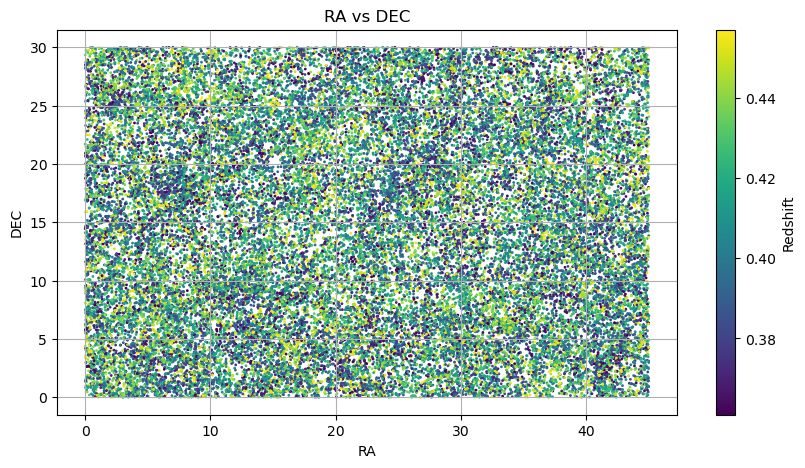

Plotting for redshift bin 4


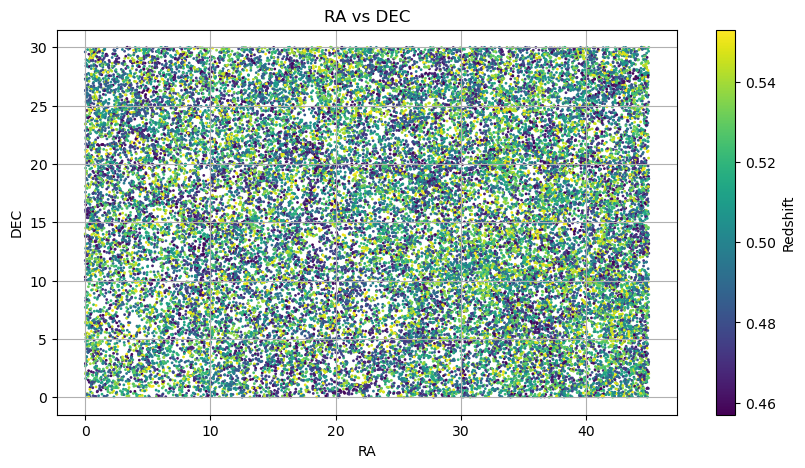

Plotting for redshift bin 5


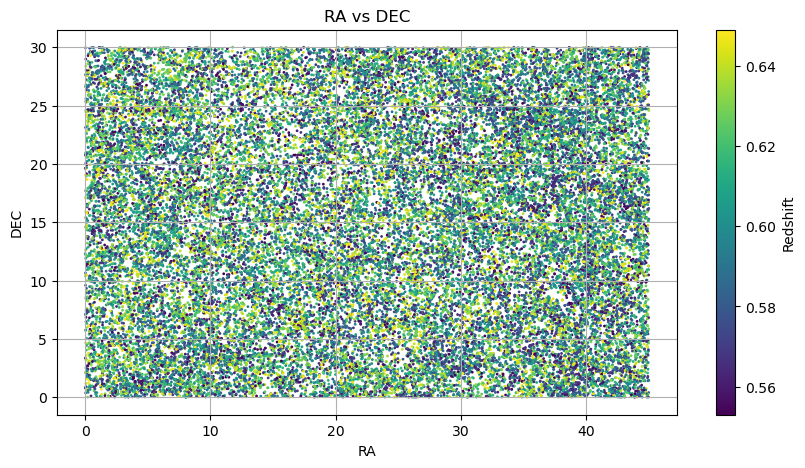

Plotting for redshift bin 6


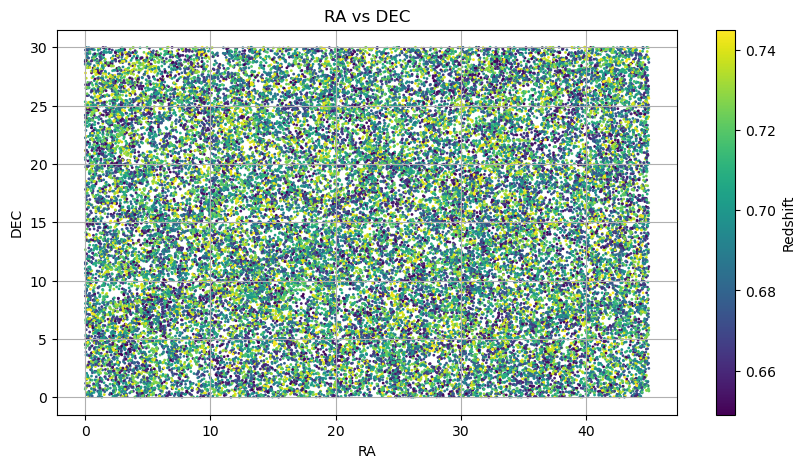

Plotting for redshift bin 7


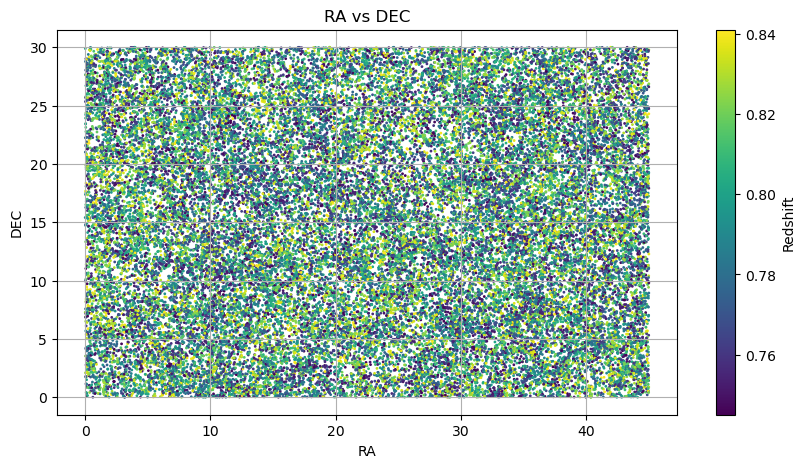

Plotting for redshift bin 8


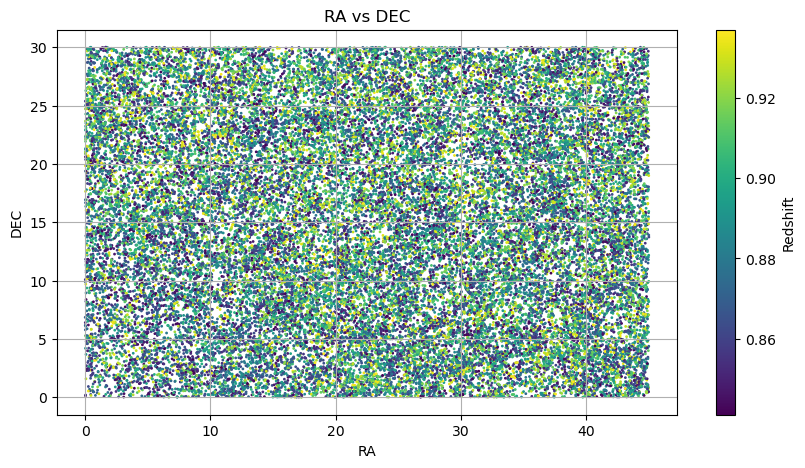

Plotting for redshift bin 9


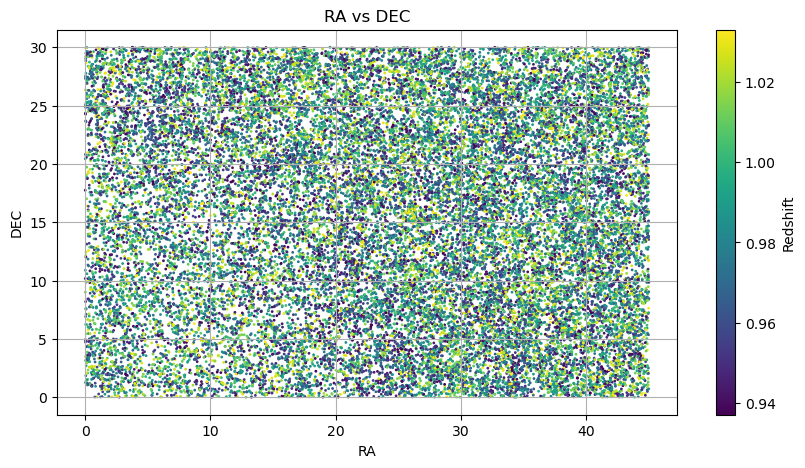

Plotting for redshift bin 10


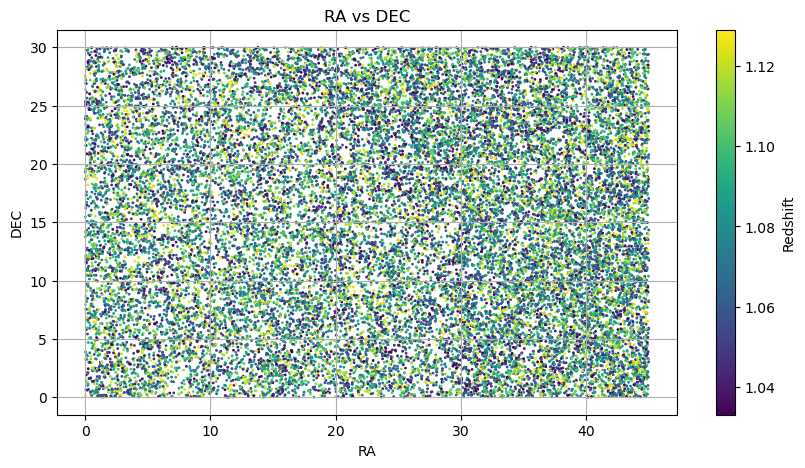

Plotting for redshift bin 11


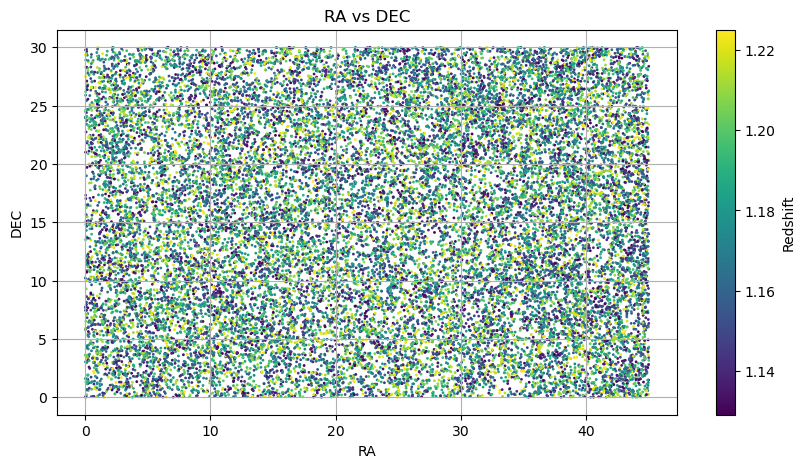

Plotting for redshift bin 12


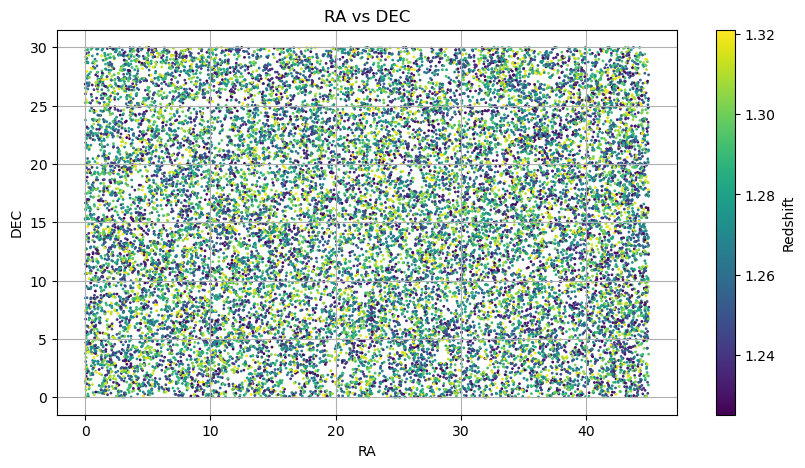

Plotting for redshift bin 13


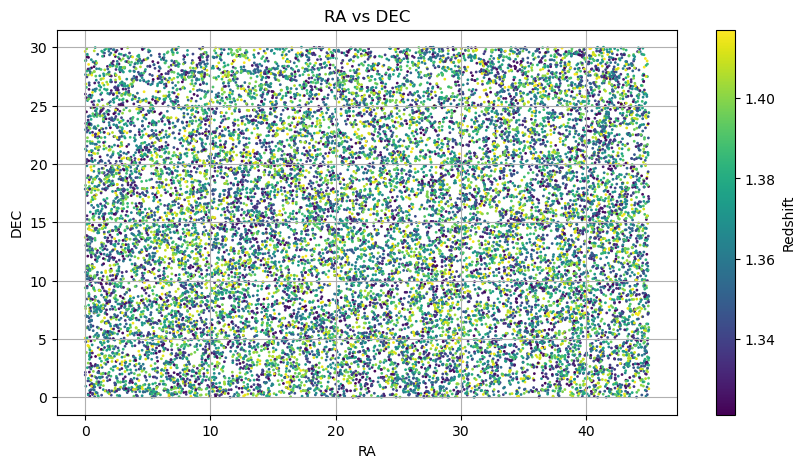

In [26]:
#Define the region of interest (example: 1350 square degrees)
ra_min, ra_max = 0, 45  # Right ascension range in degrees
dec_min, dec_max = 0, 30  # Declination range in degrees

# Plot the region of interest for each redshift bin
for bin_num in range(num_bins):
    print(f"Plotting for redshift bin {bin_num}")
    plot_region_of_interest(binned_data[bin_num]["ra_gal"], binned_data[bin_num]["dec_gal"], binned_data[bin_num]["z_cgal"], ra_min, ra_max, dec_min, dec_max)

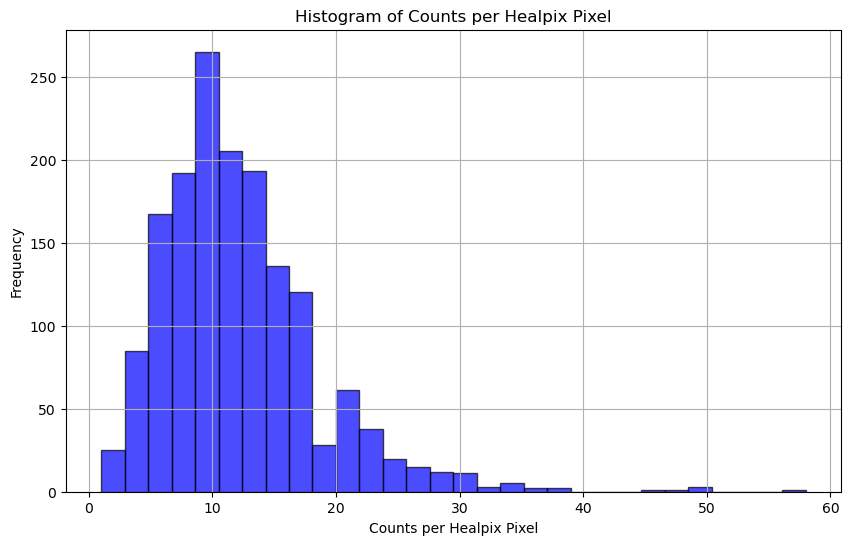

In [27]:
# Example usage for bin 0
counts_bin_0 = calculate_galaxies_per_pixel(0, nside=64, ra_min=ra_min, ra_max=ra_max, dec_min=dec_min, dec_max=dec_max)    

# Plot histogram of counts per pixel
plt.figure(figsize=(10, 6))
plt.hist(counts_bin_0[counts_bin_0 > 0], bins=30, color='blue', alpha=0.7, edgecolor='black')
plt.xlabel('Counts per Healpix Pixel')
plt.ylabel('Frequency')
plt.title('Histogram of Counts per Healpix Pixel')
plt.grid(True)
plt.show()

In [16]:
def calculate_mean_variance(map_data, nside):
    """
    Calculate the mean and variance of the given map data.
    
    Parameters:
    map_data (numpy.ndarray): The map data.
    nside (int): The nside parameter for HEALPix.
    
    Returns:
    tuple: mean and variance of the map data.
    """
    mean = np.mean(map_data)
    #print(mean)
    variance = np.var(map_data)
    return mean, variance

def visualize_error_bars(binned_data, nsides):
    means = []
    variances = []
    errors = []
        
    for nside in nsides:
        mean_bin = []
        variance_bin = []
        error_bin = []
            
        for bin_num in range(num_bins):
            ra = binned_data[bin_num]["ra_gal"]
            dec = binned_data[bin_num]["dec_gal"]
            theta = np.pi/2 - np.deg2rad(dec)
            phi = np.deg2rad(ra)
            pixels = hp.ang2pix(nside, theta, phi)
            map_data = np.bincount(pixels, minlength=hp.nside2npix(nside))
                
            mean, variance = calculate_mean_variance(map_data, nside)
            mean_bin.append(mean)
            variance_bin.append(variance)
            error_bin.append(np.sqrt(variance / len(map_data)))
            
        means.append(mean_bin)
        variances.append(variance_bin)
        errors.append(error_bin)
        
    means = np.array(means)
    errors = np.array(errors)
               
    plt.figure(figsize=(10, 6))
    for bin_num in range(num_bins):
        plt.errorbar(nsides, means[:, bin_num], yerr=errors[:, bin_num], label=f'Bin {bin_num}', capsize=5)
        
    plt.xlabel('Nside')
    plt.ylabel('Mean Galaxy Count')
    plt.title('Mean Galaxy Count with Error Bars for Different Redshift Bins')
    plt.legend()
    plt.grid(True)
    plt.xscale('log')
    plt.show()

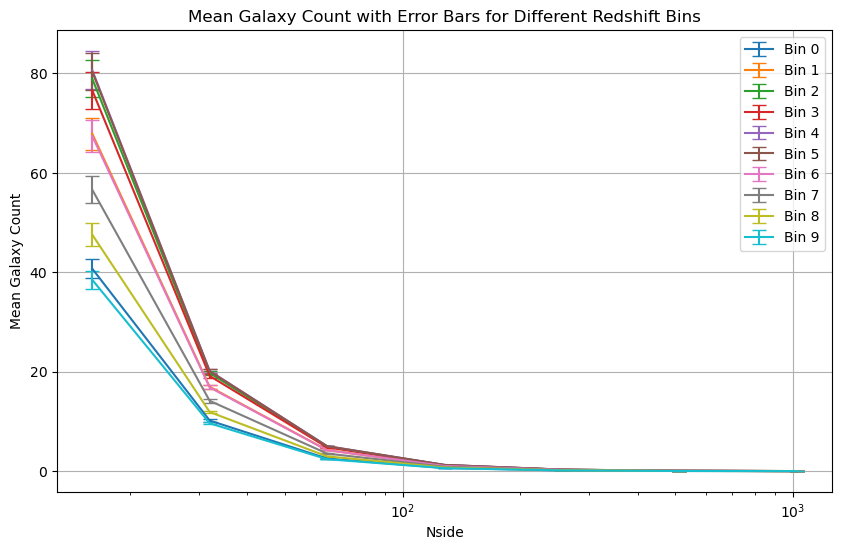

In [17]:
# Example usage
nsides = [16, 32, 64, 128, 256, 512, 1024]
visualize_error_bars(binned_data, nsides)

In [18]:
def calculate_pixel_correlation(healpix_map, nside):
    npix = hp.nside2npix(nside)
    neighbors = hp.get_all_neighbours(nside, np.arange(npix))
    mean_pixel_value = np.mean(healpix_map)
    
    correlations = []
    for i in range(npix):
        pixel_value = healpix_map[i]
        neighbor_values = healpix_map[neighbors[:, i]]
        valid_neighbors = neighbor_values[neighbor_values >= 0]  # Filter out invalid neighbors
        
        if len(valid_neighbors) > 1:
            # Calculate Spearman correlation
            # 1. Create the repeated pixel value array
            repeated_pixel_value = np.array([pixel_value] * len(valid_neighbors))

            # 3. Calculate deviations from the mean
            deviation_pixel_value = repeated_pixel_value - mean_pixel_value  # This will be an array of zeros
            deviation_valid_neighbors = valid_neighbors - mean_pixel_value

            # 4. Calculate the numerator (covariance part)
            numerator = np.sum(deviation_pixel_value * deviation_valid_neighbors)

            # 5. Calculate the denominator (variance parts)
            denominator_pixel_value = np.sqrt(np.sum(deviation_pixel_value ** 2))
            denominator_valid_neighbors = np.sqrt(np.sum(deviation_valid_neighbors ** 2))

            # 6. Calculate the correlation coefficient
            if denominator_pixel_value == 0 or denominator_valid_neighbors == 0:
                correlation = np.nan  # or np.nan if you prefer
            else:
                correlation = numerator / (denominator_pixel_value * denominator_valid_neighbors)

            correlations.append(correlation)
    
    return np.nanmean(correlations)  # Return the mean correlation coefficient

Calculating correlation for bin 0 and nside 16
Calculating correlation for bin 1 and nside 16
Calculating correlation for bin 2 and nside 16
Calculating correlation for bin 3 and nside 16
Calculating correlation for bin 4 and nside 16
Calculating correlation for bin 5 and nside 16
Calculating correlation for bin 6 and nside 16
Calculating correlation for bin 7 and nside 16
Calculating correlation for bin 8 and nside 16
Calculating correlation for bin 9 and nside 16
Calculating correlation for bin 0 and nside 32
Calculating correlation for bin 1 and nside 32
Calculating correlation for bin 2 and nside 32
Calculating correlation for bin 3 and nside 32
Calculating correlation for bin 4 and nside 32
Calculating correlation for bin 5 and nside 32
Calculating correlation for bin 6 and nside 32
Calculating correlation for bin 7 and nside 32
Calculating correlation for bin 8 and nside 32
Calculating correlation for bin 9 and nside 32
Calculating correlation for bin 0 and nside 64
Calculating c

Calculating correlation for bin 2 and nside 64
Calculating correlation for bin 3 and nside 64
Calculating correlation for bin 4 and nside 64
Calculating correlation for bin 5 and nside 64
Calculating correlation for bin 6 and nside 64
Calculating correlation for bin 7 and nside 64
Calculating correlation for bin 8 and nside 64
Calculating correlation for bin 9 and nside 64
Calculating correlation for bin 0 and nside 128
Calculating correlation for bin 1 and nside 128
Calculating correlation for bin 2 and nside 128
Calculating correlation for bin 3 and nside 128
Calculating correlation for bin 4 and nside 128
Calculating correlation for bin 5 and nside 128
Calculating correlation for bin 6 and nside 128
Calculating correlation for bin 7 and nside 128
Calculating correlation for bin 8 and nside 128
Calculating correlation for bin 9 and nside 128
Calculating correlation for bin 0 and nside 256
Calculating correlation for bin 1 and nside 256
Calculating correlation for bin 2 and nside 256


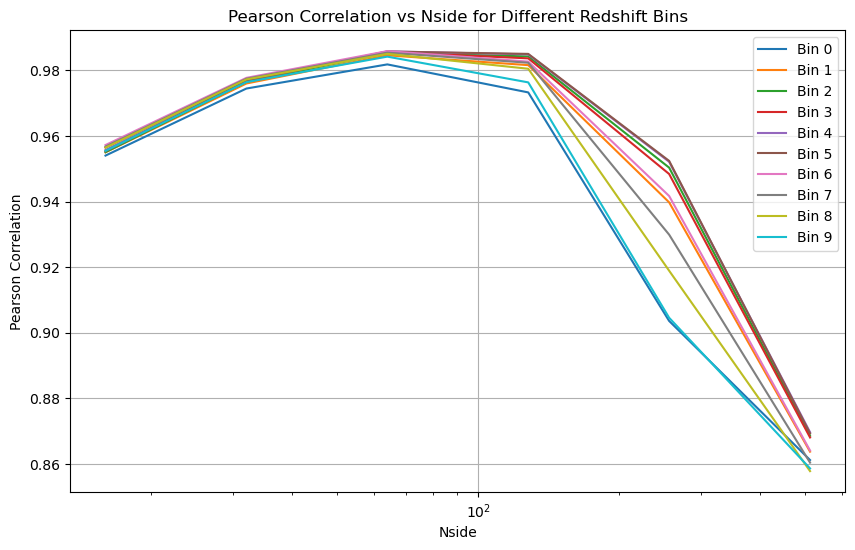

In [21]:
# Calculate Pearson correlation for different nsides and redshift bins
correlations = []
nsides = [16, 32, 64, 128, 256, 512]
for nside in nsides:
    correlation_bin = []
    for bin_num in range(num_bins):
        print(f"Calculating correlation for bin {bin_num} and nside {nside}")
        ra = binned_data[bin_num]["ra_gal"]
        dec = binned_data[bin_num]["dec_gal"]
        theta = np.pi/2 - np.deg2rad(dec)
        phi = np.deg2rad(ra)
        pixels = hp.ang2pix(nside, theta, phi)
        map_data = np.bincount(pixels, minlength=hp.nside2npix(nside))
        
        correlation = calculate_pixel_correlation(map_data, nside)
        correlation_bin.append(correlation)
        
    correlations.append(correlation_bin)

correlations = np.array(correlations)

# Plot the Pearson correlation against nside for different redshift bins
plt.figure(figsize=(10, 6))
for bin_num in range(num_bins):
    plt.plot(nsides, correlations[:, bin_num], label=f'Bin {bin_num}')

plt.xlabel('Nside')
plt.ylabel('Pearson Correlation')
plt.title('Pearson Correlation vs Nside for Different Redshift Bins')
plt.legend()
plt.grid(True)
plt.xscale('log')
plt.show()